Useful stepping stone. Use k-means to help automatically threshold cell body and produce an accurate outline. Then develop a NN to reproduce outline value at fixed angles. Cell images must be 

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from PIL import Image
from scipy.signal import convolve2d
from skimage.measure import block_reduce, find_contours
from matplotlib.patches import Rectangle
from kural_core.models import *
from kural_core.data_processing import *
from kural_core.functions import *
import pickle
from scipy.misc import imresize
from scipy.ndimage import morphology
from scipy.spatial import ConvexHull
from skimage import measure
from matplotlib import animation, rc
from IPython.display import HTML
from os import listdir

PATH = r'D:\Code\kural_work\movie_generation\data\\'


In [18]:
all_files = listdir(PATH)
crops = []
for file in all_files:
    if file[-13:] != 'crop_data.pkl': continue
    crops.append(file)
crop_img = []
xy = []
for crop in crops:
    with open(PATH+crop,'rb') as f:
        tmp_crop, tmp_xy,cx,cy,w,h = pickle.load(f)
        crop_img.append(tmp_crop)
        xy.append(tmp_xy)
crop_img = np.concatenate(crop_img)
xy = np.concatenate(xy)

In [3]:
img_ = Image.open(PATH+'as05_15m_1s_50ms_100p.tif')
nf = img_.n_frames
img = np.zeros((nf,512,512))
for f in range(nf):
    img_.seek(f)
    img[f] = np.array(img_)

In [4]:
k_mean_img, cent = k_means_classifier(img,5)

Finished iteration 14
Done


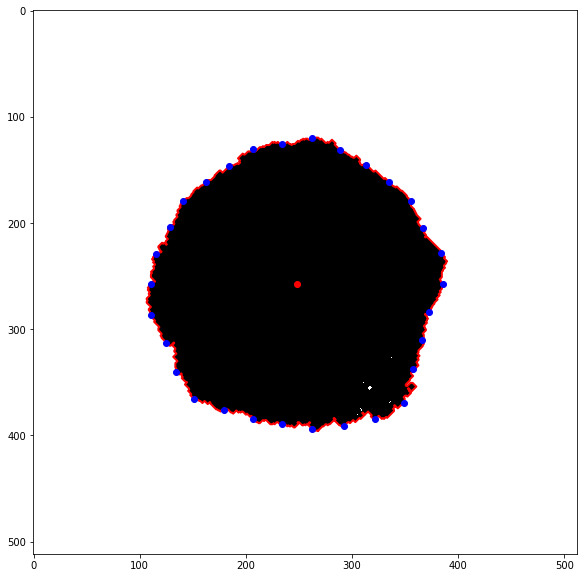

In [177]:
i = np.random.choice(nf)
tmp = morphology.binary_erosion(k_mean_img[i],iterations=2,mask=k_mean_img[i]>0)
tmp = morphology.binary_dilation(tmp*k_mean_img[i],iterations=3,mask=(tmp*k_mean_img[i])==0).astype(np.int)
# tmp = morphology.binary_fill_holes(tmp)
contours = measure.find_contours(tmp,.5)
ll = 0
for idx, contour in enumerate(contours):
    if contour.size>ll:
        li = idx
        ll = contour.size
contour = contours[li]
plt.figure(figsize=[10,10])
plt.imshow(1-tmp,cmap=plt.cm.gray)
plt.plot(contour[:,1],contour[:,0],'r',linewidth=2)
cx = l[i]+w[i]/2
cy = t[i]+h[i]/2
plt.plot(cx,cy,'ro')
r = np.sqrt((contour[:,1]-cx)**2+(contour[:,0]-cy)**2)
th = np.arctan2(contour[:,0]-cy,contour[:,1]-cx)+np.pi
angs = np.argmin(np.abs(th.reshape(-1,1)-angles.reshape(1,-1)),axis=0)
plt.plot(cx-r[angs]*np.cos(th[angs]),cy-r[angs]*np.sin(th[angs]),'bo')
plt.show()

In [10]:
xy = np.zeros((nf,2,num_angles))
for i in range(nf):
    tmp = morphology.binary_erosion(k_mean_img[i],iterations=2,mask=k_mean_img[i]>0)
    tmp = morphology.binary_dilation(tmp*k_mean_img[i],iterations=3,mask=(tmp*k_mean_img[i])==0).astype(np.int)
    # tmp = morphology.binary_fill_holes(tmp)
    contours = measure.find_contours(tmp,.5)
    ll = 0
    for idx, contour in enumerate(contours):
        if contour.size>ll:
            li = idx
            ll = contour.size
    contour = contours[li]
    cx = l[i]+w[i]/2
    cy = t[i]+h[i]/2
    r = np.sqrt((contour[:,1]-cx)**2+(contour[:,0]-cy)**2)
    th = np.arctan2(contour[:,0]-cy,contour[:,1]-cx)+np.pi
    angs = np.argmin(np.abs(th.reshape(-1,1)-angles.reshape(1,-1)),axis=0)
    xy[i] = np.array([-r[angs]*np.cos(th[angs])/w[i]+63.5/128, -r[angs]*np.sin(th[angs])/h[i]+63.5/128])

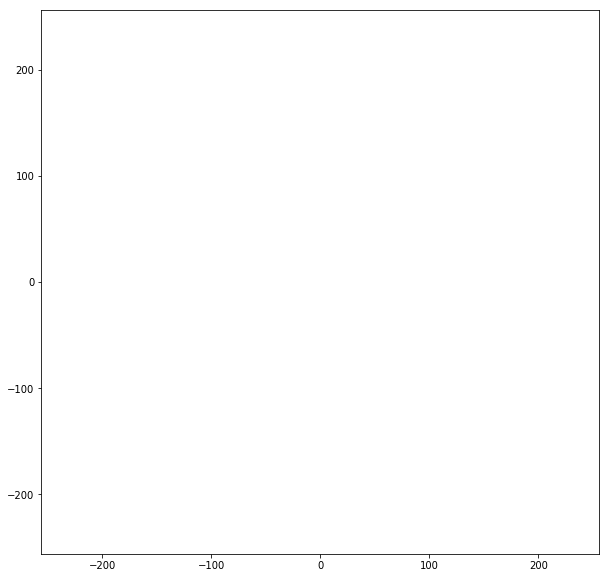

In [186]:
fig,ax = plt.subplots(figsize=[10,10])
ax.set_xlim(( -256, 256))
ax.set_ylim((-256, 256))
i = 0
tmp = morphology.binary_erosion(k_mean_img[i],iterations=2,mask=k_mean_img[i]>0)
tmp = morphology.binary_dilation(tmp*k_mean_img[i],iterations=3,mask=(tmp*k_mean_img[i])==0).astype(np.int)
contours = measure.find_contours(tmp,.5)
ll = 0
for idx, contour in enumerate(contours):
    if contour.size>ll:
        li = idx
        ll = contour.size
contour = contours[li]
cx = l[i]+w[i]/2
cy = t[i]+h[i]/2
contour -= np.array([cy,cx]).reshape(1,2)
r = np.sqrt(contour[:,1]**2+contour[:,0]**2)
th = np.arctan2(contour[:,0],contour[:,1])+np.pi
angs = np.argmin(np.abs(th.reshape(-1,1)-angles.reshape(1,-1)),axis=0)
p1, = ax.plot(contour[:,1],contour[:,0],'r',linewidth=2)
p2, = ax.plot(-r[angs]*np.cos(th[angs]),-r[angs]*np.sin(th[angs]),'bo')
def init():
    p1.set_xdata([np.nan]*contour.shape[0])
    p1.set_ydata([np.nan]*contour.shape[0])
    p2.set_xdata([np.nan]*num_angles)
    p2.set_ydata([np.nan]*num_angles)
def animate(i,y0,l,w,t,h):
    tmp = morphology.binary_erosion(y0[i],iterations=2,mask=y0[i]>0)
    tmp = morphology.binary_dilation(tmp*y0[i],iterations=3,mask=(tmp*y0[i])==0).astype(np.int)
    contours = measure.find_contours(tmp,.5)
    ll = 0
    for idx, contour in enumerate(contours):
        if contour.size>ll:
            li = idx
            ll = contour.size
    contour = contours[li]
    cx = l[i]+w[i]/2
    cy = t[i]+h[i]/2
    contour -= np.array([cy,cx]).reshape(1,2)
    r = np.sqrt(contour[:,1]**2+contour[:,0]**2)
    th = np.arctan2(contour[:,0],contour[:,1])+np.pi
    angs = np.argmin(np.abs(th.reshape(-1,1)-angles.reshape(1,-1)),axis=0)
    p1.set_xdata(contour[:,1])
    p1.set_ydata(contour[:,0])
    p2.set_xdata(-r[angs]*np.cos(th[angs]))
    p2.set_ydata(-r[angs]*np.sin(th[angs]))
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=nf, fargs=(k_mean_img,l,w,t,h), interval=100, blit=False)
HTML(anim.to_html5_video())

In [154]:
r = np.sqrt((contour[:,1]-cx)**2+(contour[:,0]-cy)**2)
th = np.arctan2(contour[:,0]-cy,contour[:,1]-cx)+np.pi

In [9]:
num_angles = 30
angles = np.array([i*2*np.pi/num_angles for i in range(num_angles)])

In [164]:
angs = np.argmin(np.abs(th.reshape(-1,1)-angles.reshape(1,-1)),axis=0)
th[angs]

array([0.00587, 0.21166, 0.41937, 0.62631, 0.83776, 1.04675, 1.25439, 1.46694, 1.67495, 1.88519, 2.09293,
       2.30281, 2.5123 , 2.72337, 2.93282, 3.14159, 3.35249, 3.55808, 3.77193, 3.97957, 4.19041, 4.39841,
       4.60662, 4.81536, 5.0267 , 5.23316, 5.44472, 5.65299, 5.86464, 6.07276])

In [94]:
contours

[array([[418.5, 292. ],
        [418. , 291.5],
        [417.5, 291. ],
        ...,
        [417.5, 293. ],
        [418. , 292.5],
        [418.5, 292. ]])]

In [87]:
contours[0].shape

(2269, 2)

In [88]:
np.concatenate(contours,axis=0).shape

(2839, 2)

In [89]:
from scipy.spatial import ConvexHull

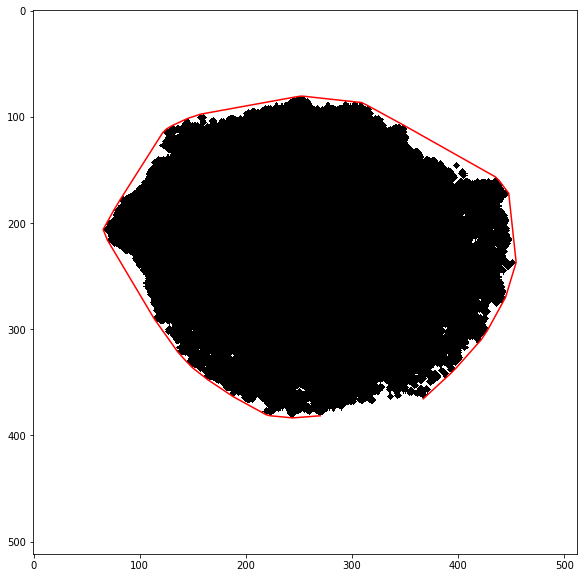

In [120]:
points = np.concatenate(contours)[:,::-1]
hull = ConvexHull(points)
plt.figure(figsize=[10,10])
plt.imshow(1-tmp,cmap=plt.cm.gray)
plt.plot(points[hull.vertices, 0], points[hull.vertices, 1], 'r-')

In [95]:
hull.vertices.shape

(30,)

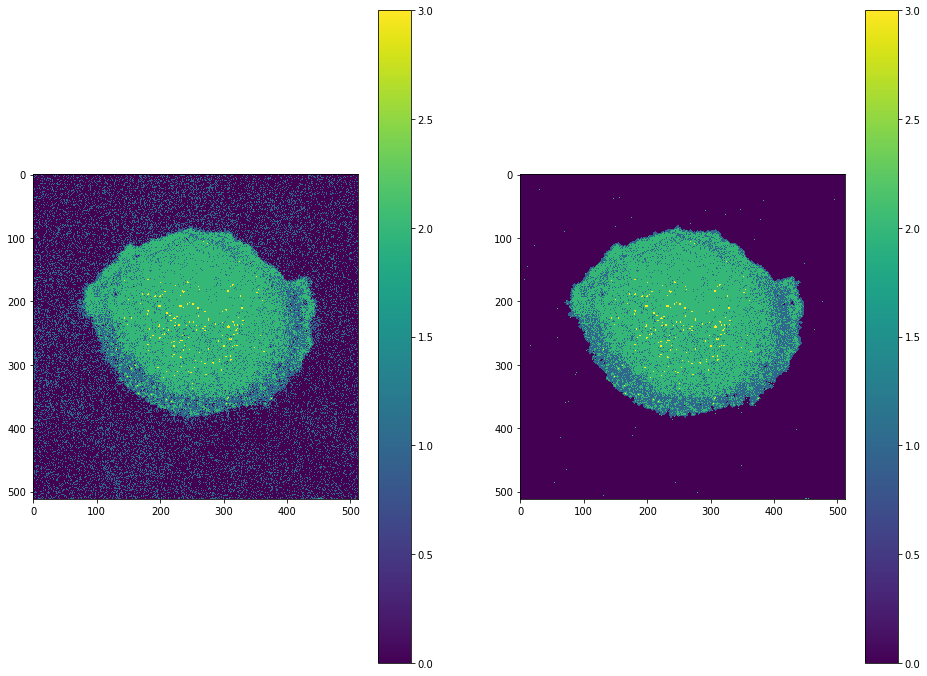

In [38]:
i = np.random.choice(nf)
tmp_kmean = k_mean_img[i].copy()
tmp_kmean[tmp_kmean==3] = 2
tmp_kmean[tmp_kmean==4] = 3
twos = tmp_kmean==2
threes = tmp_kmean==3
tmp = morphology.binary_erosion(tmp_kmean,iterations=2,mask=tmp_kmean==1)
tmp[twos]=2
tmp[threes]=3
tmp = morphology.binary_erosion(tmp,iterations=1,mask=tmp_kmean==2)
# tmp = morphology.binary_erosion(tmp*k_mean_img[i],mask=(tmp*k_mean_img[i])==1)
tmp = morphology.binary_dilation(tmp*tmp_kmean,iterations=3,mask=(tmp*tmp_kmean)==0).astype(np.int)
# tmp = morphology.binary_dilation(tmp)
# tmp = morphology.binary_dilation(tmp)
# tmp = morphology.binary_dilation(tmp)
fig, ax = plt.subplots(1,2,figsize=[16,12])
mappable = ax[0].imshow(tmp_kmean)
plt.colorbar(mappable=mappable, ax=ax[0])
tmp[twos]=2
tmp[threes]=3
mappable = ax[1].imshow(tmp)
plt.colorbar(mappable=mappable, ax=ax[1])
plt.show()

In [131]:
tmp

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [6]:
k_mean_br_img = np.zeros_like(k_mean_img)
for i in range(nf):
#     twos = k_mean_img[i]==2
    tmp = morphology.binary_erosion(k_mean_img[i],iterations=2,mask=k_mean_img[i]>0)
    tmp = morphology.binary_dilation(tmp*k_mean_img[i],iterations=3,mask=(tmp*k_mean_img[i])==0).astype(np.int)
#     tmp[twos]=2
    k_mean_br_img[i] = tmp


In [7]:
t,l,h,w = (np.zeros(nf) for _ in range(4))
for f in range(nf):
    contours = measure.find_contours(k_mean_br_img[f],.5)
    ll = 0
    for i, contour in enumerate(contours):
        if contour.size>ll:
            li = i
            ll = contour.size
    contour = contours[li]
    t[f] = min(contour[:,0])-5
    h[f] = max(contour[:,0])-min(contour[:,0])+10
    l[f] = min(contour[:,1])-5
    w[f] = max(contour[:,1])-min(contour[:,1])+10

In [8]:
i = np.arange(143)
t = 115 - 20*(i/(nf-1))
l = 135 - 20*(i/(nf-1))
w = 215 + 40*(i/(nf-1))
h = 225 + 40*(i/(nf-1))

In [137]:
k_mean_crop_img = np.zeros((nf,64,64))
for i in range(nf):
    k_mean_crop_img[i] = np.array(Image.fromarray(k_mean_img[i,int(t[i]):int(t[i]+h[i]),int(l[i]):int(l[i]+w[i])]).resize(size=(64,64),resample=Image.NEAREST))

In [12]:
crop_img = np.zeros((nf,128,128))
for i in range(nf):
    crop_img[i] = np.array(Image.fromarray(img[i,int(t[i]):int(t[i]+h[i]),int(l[i]):int(l[i]+w[i])]).resize(size=(128,128),resample=Image.LANCZOS))

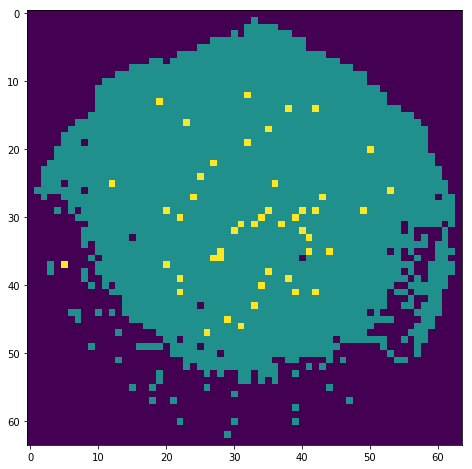

In [148]:
idx = np.random.choice(range(nf))
plt.figure(figsize=[8,8])
plt.imshow(k_mean_crop_img[idx])
plt.show()

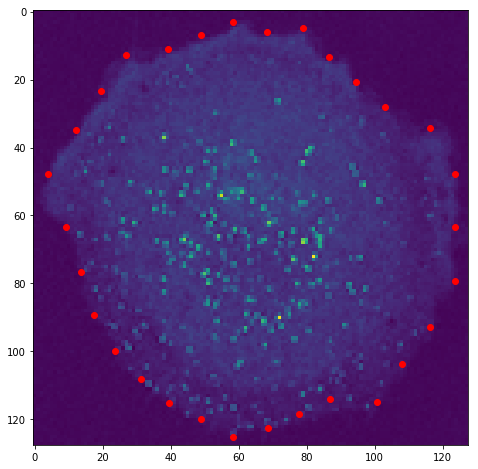

In [216]:
idx = np.random.choice(range(nf))
plt.figure(figsize=[8,8])
plt.imshow(crop_img[idx])
cx = l[idx]+w[idx]/2
x = (xy[idx,0]-cx)*128/w[idx]+63.5
cy = t[idx]+h[idx]/2
y = (xy[idx,1]-cy)*128/h[idx]+63.5
plt.plot(x,y,'ro')
plt.show()

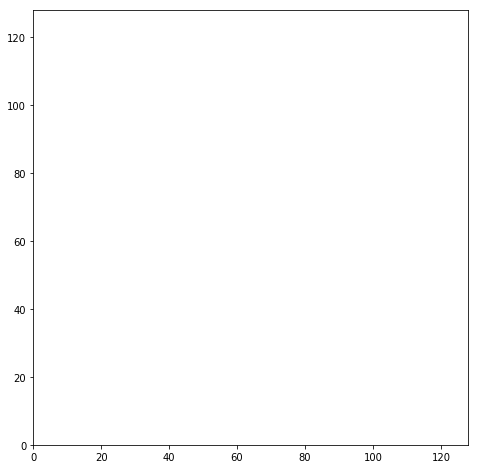

In [80]:
fig,ax = plt.subplots(figsize=[8,8])
ax.set_xlim(( 0, 128))
ax.set_ylim((0, 128))
im0 = ax.imshow(crop_img[0], animated=True)
def init():
    im0.set_array([[]])
    return im0,
def animate(i,y0):
    im0.set_array(y0[i])
    return  im0,
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=nf, fargs=[crop_img], interval=20, blit=False)
HTML(anim.to_html5_video())

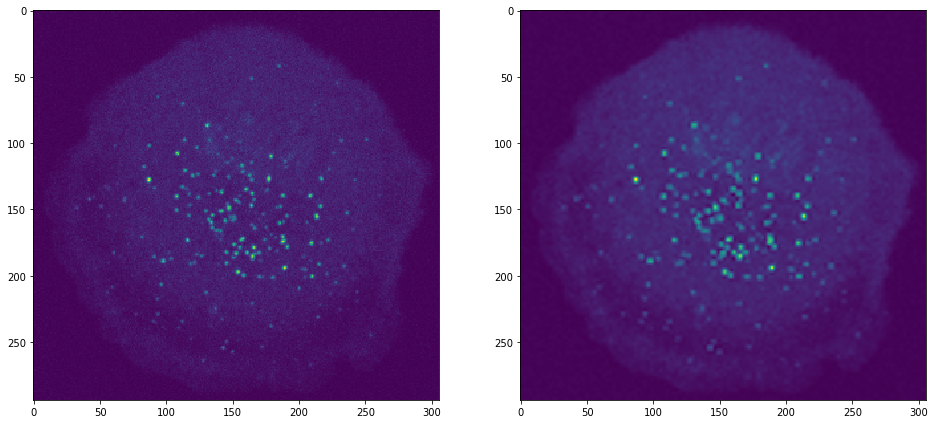

In [77]:
fig, ax = plt.subplots(1,2,figsize=[16,10])
i = np.random.choice(range(nf))
im1 = img[i,int(t[i]):int(t[i]+h[i]),int(l[i]):int(l[i]+w[i])]
im2 = np.array(Image.fromarray(crop_img[i]).resize(size=(int(w[i]),int(h[i])),resample=Image.BICUBIC))
ax[0].imshow(im1)
ax[1].imshow(im2)
plt.show()

In [191]:
img_tensor = torch.tensor(crop_img)
kMean_tensor = torch.tensor(k_mean_crop_img)

In [201]:
torch.save((img_tensor,kMean_tensor),PATH+'AE_img_tensor.variable')

In [2]:
img_tensor,kMean_tensor = torch.load(PATH+'AE_img_tensor.variable')

In [22]:
crop_img_tensor = torch.tensor(crop_img/SCALE_FACTOR).view(crop_img.shape[0],1,128,128).float()
xy_tensor = torch.tensor(xy).float()
fname = 'crop_img_xy_tensor.variable'
torch.save((crop_img_tensor,xy_tensor),PATH+fname)

In [2]:
fname = 'crop_img_xy_tensor.variable'
crop_img_tensor,xy_tensor = torch.load(PATH+fname)

In [323]:
torch.save(crop_img_tensor,PATH+'tmp.variable')

In [3]:
crop_img_tensor = torch.load(PATH+'tmp.variable')

In [320]:
nf = crop_img_tensor.shape[0]
s2 = np.sqrt(2)
kernel = np.array([[-1,-s2,-1],[-s2,4*(1+s2),-s2],[-1,-s2,-1]])
alpha = .05
for i in range(nf):
    img = crop_img_tensor[i,0].numpy()
    for k in range(100):
        diverge = convolve2d(img,kernel,mode='same',boundary='wrap')
        img -= (-1)**k*alpha*diverge
    if i%100==99:
        print(i)

99
199
299
399
499
599
699
799
899
999
1099
1199
1299
1399
1499
1599
1699
1799
1899
1999
2099
2199
2299
2399
2499
2599
2699
2799
2899
2999
3099
3199
3299
3399
3499
3599
3699
3799
3899
3999
4099
4199
4299
4399
4499
4599
4699
4799
4899
4999
5099
5199
5299
5399
5499
5599
5699
5799
5899
5999
6099
6199
6299
6399
6499
6599
6699
6799
6899
6999
7099
7199
7299
7399
7499
7599
7699
7799
7899
7999
8099
8199
8299
8399
8499
8599
8699
8799
8899
8999
9099


In [24]:
r_tensor = torch.sqrt((xy_tensor[:,1]-torch.mean(xy_tensor[:,1]))**2 + (xy_tensor[:,0]-torch.mean(xy_tensor[:,0]))**2)

In [6]:
minrt = torch.min(r_tensor)
maxrt = torch.max(r_tensor)
r_tensor = (r_tensor - minrt)/(maxrt-minrt)/2 + 0.5

In [81]:
ds = kMeanAEImageDataset(img_tensor,kMean_tensor)
train_idx, val_idx = RandomIndicesForKFoldValidation(len(ds), 0, K=5, rand_seed=42, nORp=1)
bs = 5
train_dl = torch.utils.data.DataLoader(ds,batch_size=bs, sampler=SubsetSampler(train_idx, shuffle=True))
val_dl = torch.utils.data.DataLoader(ds,batch_size=5*bs, sampler=SubsetSampler(val_idx))
model = kMeansAutoencoder().cuda()
lr_start = 1e-3
opt = optim.Adam(model.parameters(),lr=lr_start)
train_loss = []
val_loss = []
criterion = nn.CrossEntropyLoss()

In [173]:
ds = BoundingLandmarksDataset(crop_img_tensor,r_tensor)
train_idx, val_idx = RandomIndicesForKFoldValidation(len(ds), 0, K=5, rand_seed=42, nORp=1)
bs = 50
train_dl = torch.utils.data.DataLoader(ds,batch_size=bs, sampler=SubsetSampler(train_idx, shuffle=True))
val_dl = torch.utils.data.DataLoader(ds,batch_size=5*bs, sampler=SubsetSampler(val_idx))
model = BoundingPointsModel().cuda()
lr_start = 1e-3
opt = optim.Adam(model.parameters(),lr=lr_start)
train_loss = []
val_loss = []
criterion = nn.MSELoss()

In [49]:
train_idx, val_idx = RandomIndicesForKFoldValidation(len(ds), 0, K=5, nORp=1)
bs = 1
train_dl = torch.utils.data.DataLoader(ds,batch_size=bs, sampler=SubsetSampler(train_idx, shuffle=True))
val_dl = torch.utils.data.DataLoader(ds,batch_size=5*bs, sampler=SubsetSampler(val_idx))
lr_start = 1e-3

In [174]:
# @do_profile(follow=[])
# def profile_fit():
restarts = 1
# lr_start = 1e-3
lr_end = lr_start
for restart in range(restarts):
    cycles = 1
    epochs = 50
    print(f'restart number {restart+1} out of {restarts}')
#     if len(train_loss)>0: opt = optim.SGD(model.parameters(),lr=lr_start,momentum=0.9)
    # lr_div = (lr_start/lr_end)**(1/epochs)
    time_list = []
    epoch_time_list = None
    cycle_print_str = 'Cycle: 0 ~ Remaining total: Unknown'
    print(cycle_print_str,end='')
    for cycle in range(cycles):
        ts = time.clock()
        if cycle>0: epochs = epochs*2
        lr_start = lr_start*(0.999)**cycle
        epoch_print_str = f' ~ Epoch: 0 ~ Remaining in cycle: {(epochs*np.mean(epoch_time_list) if epoch_time_list is not None else 0):.3g}s'
        print(epoch_print_str, end='')
        epoch_time_list = []
        for epoch in range(epochs):
            ets = time.clock()
            opt.param_groups[0]['lr'] = lr_end + 0.5*(lr_start-lr_end)*(1+math.cos(cycle/cycles*np.pi))
    #         lr /= lr_div
            running_loss = 0.0
            model.train()
            for data in train_dl:
                x_train = data[0].cuda()
                opt.zero_grad()
                y_pred = model(x_train)
                loss = criterion(y_pred,data[1].view(-1,30).cuda())
                loss.backward()
                opt.step()
                running_loss += loss.item()
            train_loss.append(running_loss/len(train_dl))

            running_loss = 0.0
            model.eval()
            with torch.no_grad():
                for data in val_dl:
                    x_train = data[0].cuda()
                    y_pred = model(x_train)
                    running_loss += criterion(y_pred,data[1].view(-1,30).cuda()).item()
                val_loss.append(running_loss/len(val_dl))
            epoch_time_list.append(time.clock()-ets)
            if epoch_print_str: 
                for _ in range(len(epoch_print_str)):
                    print('\b',end='')
            epoch_print_str = f' ~ Epoch: {epoch+1:2d}/{epochs} ~ Remaining in cycle: {(epochs-(epoch+1))*np.mean(epoch_time_list):.3g}s'
            print(epoch_print_str,end='')
        time_list.append(time.clock()-ts)
        if cycle_print_str: 
            for _ in range(len(cycle_print_str)+len(epoch_print_str)):
                print('\b',end='')
        remaining_time = (cycles-(cycle+1))*np.mean(time_list)
        cycle_print_str = f'Cycle: {cycle+1:3d}/{cycles} ~ Remaining total: {int(remaining_time//60)}m {remaining_time%60:02.0f}s'
        print(cycle_print_str,end='')
    for _ in range(len(cycle_print_str)):
                print('\b',end='')
    print(f'Spent {int(sum(time_list)//60)}m {sum(time_list)%60:2.0f}s doing {cycles*epochs} total steps for an average of {sum(time_list)/cycles/epochs:3.1f}s per step.')
        
#         return (train_loss, val_loss)

# torch.save(model.state_dict(),'C:\\Users\\joshu\\Documents\\fastai\\courses\\kural_work\\kMeans_autoencoder_model.pth')

restart number 1 out of 1
Spent 10m 11s doing 50 total steps for an average of 12.2s per step.


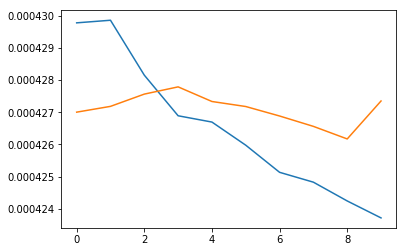

In [177]:
slc = slice(40,len(train_loss))
plt.plot(train_loss[slc])
plt.plot(val_loss[slc])
plt.show()

In [176]:
idl = iter(train_dl)

In [181]:
data = next(idl)
x_train = data[0].cuda()
opt.zero_grad()
y_pred = model(x_train)
loss = criterion(y_pred,data[1].view(-1,30).cuda())
loss.backward()
opt.step()
p = list(model.parameters())
for i in range(len(p)):
    print((torch.sum(torch.abs(p[i])<1e-8).item()/p[i].numel()))
print('')
for i in range(len(p)):
    print((torch.sum(torch.abs(p[i].grad)<1e-8).item()/p[i].numel()))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.712673611111111e-05
0.0
0.0
0.0
0.0
0.0
7.152557373046875e-07
0.0
9.5367431640625e-07
0.0
0.0
0.0
0.0
0.0
0.0
0.0

1.0
0.625
0.828125
0.5625
0.83203125
0.4375
0.7790798611111112
0.5
0.794921875
0.5
0.8160807291666666
0.59375
0.790771484375
0.484375
0.7828369140625
0.5703125
0.8359375
0.6171875
0.8725395202636719
0.6318359375
0.8634109497070312
0.474609375
0.819366455078125
0.435546875
0.7928886413574219
0.388671875
0.3897786458333333
0.0


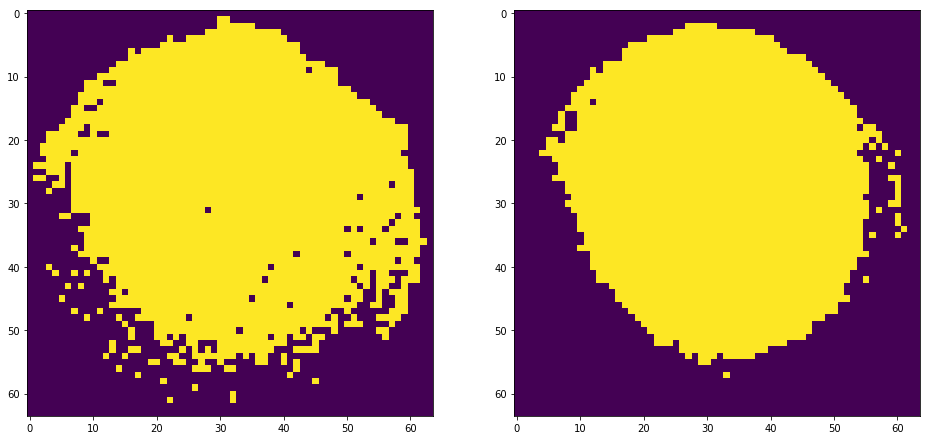

In [116]:
which_idx=train_idx
idx = np.random.choice(which_idx)
fig, ax = plt.subplots(1,2,figsize=[16,8])
plt.imshow(np.zeros((512,512)))
img,kMean = ds[idx]
ax[0].imshow(kMean>0)
model.eval()
tmp_img = torch.argmax(model(img.float().cuda()/SCALE_FACTOR),dim=1)
mappable = ax[1].imshow(tmp_img[0].data.cpu())
# plt.colorbar(mappable=mappable,ax=ax[1])
plt.show()

In [65]:
idx = np.random.choice(len(ds))
tmp = model.convolution(ds[idx][0][None].cuda())

RuntimeError: shape '[2, 30]' is invalid for input of size 30

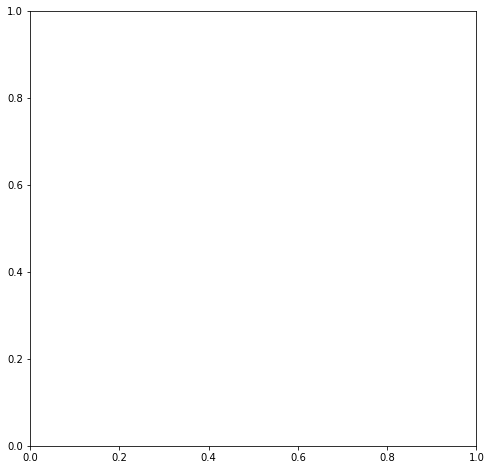

In [8]:
which_idx=train_idx
idx = np.random.choice(which_idx)
fig, ax = plt.subplots(1,1,figsize=[8,8])
img,xy = ds[idx]
ax.imshow(img[0].numpy())
model.eval()
xy_pred = model(img.float().view(1,1,128,128).cuda()).data.view(2,30).cpu().numpy()*128
ax.plot(xy_pred[0,:],xy_pred[1,:],'ro-')
# ax.plot(xy[0].numpy()*128,xy[1].numpy()*128,'go-')
plt.show()

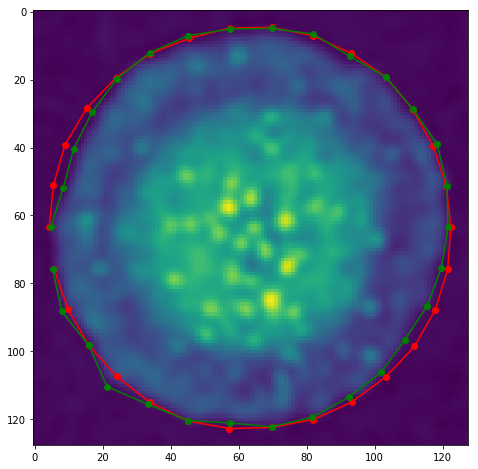

In [190]:
which_idx=val_idx
idx = np.random.choice(which_idx)
fig, ax = plt.subplots(1,1,figsize=[8,8])
img,r = ds[idx]
r = r.reshape(1,30).data.numpy()
ax.imshow(img[0].numpy())
model.eval()
r_pred = model(img.float().view(1,1,128,128).cuda()).data.view(1,30).cpu()
# r_pred = (maxrt-minrt)*2*(r_pred - 0.5) + minrt
r_pred = r_pred.numpy()
th = np.linspace(0,2*np.pi,31)[:-1]
xy_pred = 128*np.r_[63.5/128-r_pred*np.cos(th), 63.5/128-r_pred*np.sin(th)]
ax.plot(xy_pred[0,:],xy_pred[1,:],'ro-')
xy = 128*np.r_[63.5/128-r*np.cos(th), 63.5/128-r*np.sin(th)]
ax.plot(xy[0,:],xy[1,:],'go-')
plt.show()

In [106]:
xy.shape

(2, 30)

NameError: name 'tmp' is not defined

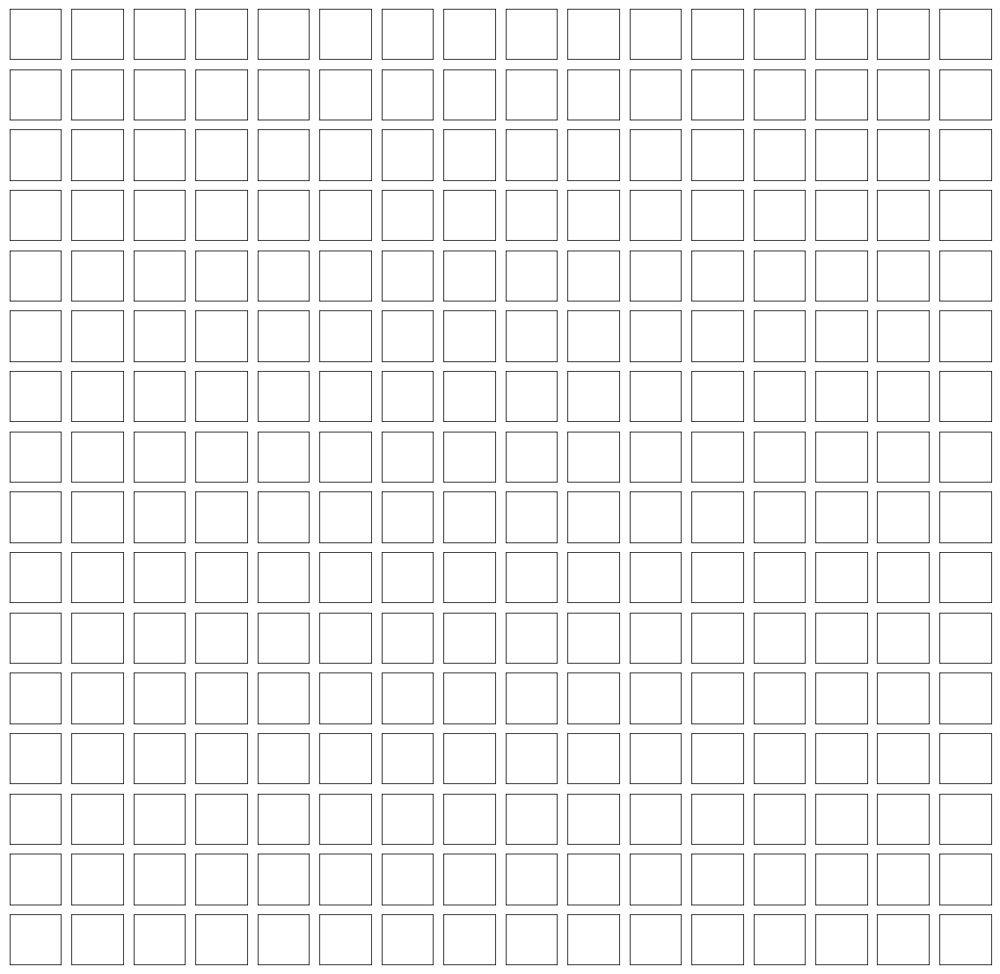

In [155]:
fig, ax = plt.subplots(16,16,figsize=[20,20])
ax = ax.flatten()
for i in range(256):
    ax[i].set_yticks([])
    ax[i].set_xticks([])
for i in range(256):
    mappable = ax[i].imshow(tmp[0,i].cpu().data.numpy())
#     plt.colorbar(mappable=mappable, ax=ax[i], shrink=.5)
fig.subplots_adjust(hspace=0.0, wspace=0.0)

In [33]:
ds[idx][1].shape

torch.Size([30])

In [191]:
p = list(model.parameters())
for i in range(len(p)):
    print((torch.sum(torch.abs(p[i])<1e-8).item()/p[i].numel()))
print('')
for i in range(len(p)):
    print((torch.sum(torch.abs(p[i].grad)==0).item()/p[i].numel()))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
2.384185791015625e-07
0.0
9.5367431640625e-07
0.0
0.0
0.0
0.0
0.0
0.0
0.0

1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
0.833984375
0.99261474609375
0.921875
0.993927001953125
0.84375
0.84375
0.0


In [36]:
imp = iter(model.parameters())

In [172]:
a = torch.sum(torch.abs(p[-3].grad)<1e-8).item();a

207

In [169]:
int(5)/int(2)

2.5

In [79]:
from scipy.signal import convolve2d

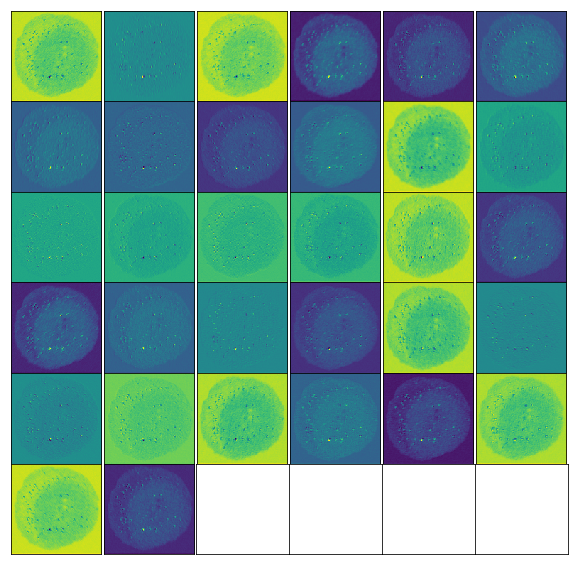

In [82]:
fig, ax = plt.subplots(6,6,figsize=[10,10])
ax = ax.flatten()
for i in range(36):
    ax[i].set_yticks([])
    ax[i].set_xticks([])
for i in range(32):
    ax[i].imshow(convolve2d(ds[0][0][0],model.convolution[0].weight[i,0].data.cpu().numpy(),mode='same')+model.convolution[0].bias[i].data.cpu().numpy())
fig.subplots_adjust(hspace=0,wspace=0)

In [136]:
s=3
r = (s-1)/2
x = y = np.linspace(-r,r,s)
x, y = np.meshgrid(x,y)
K = np.sqrt(x**2+y**2)
K /= np.sum(K)

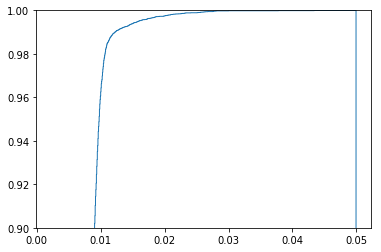

In [201]:
plt.hist(tmp_img.flatten(),bins=1000,cumulative=True,density=True,histtype='step')
plt.ylim([.9,1])
plt.show()

In [203]:
np.unravel_index(np.argmax(tmp_img),tmp_img.shape)

(94, 54)

In [209]:
tmp_mask = np.zeros_like(tmp_img)
tmp_mask[94,54]=1
tmp_mask = morphology.binary_dilation(tmp_mask)
tmp_img[tmp_mask.astype('int')*tmp_img>tmp_img.mean()]

array([0.04344, 0.01068, 0.04995, 0.02249, 0.00754], dtype=float32)

In [210]:
tmp_img.mean()

0.0059604505

In [189]:
plt.plot_surface(SpreadingKernel(13,.5))
plt.colorbar()

AttributeError: module 'matplotlib.pyplot' has no attribute 'surface'

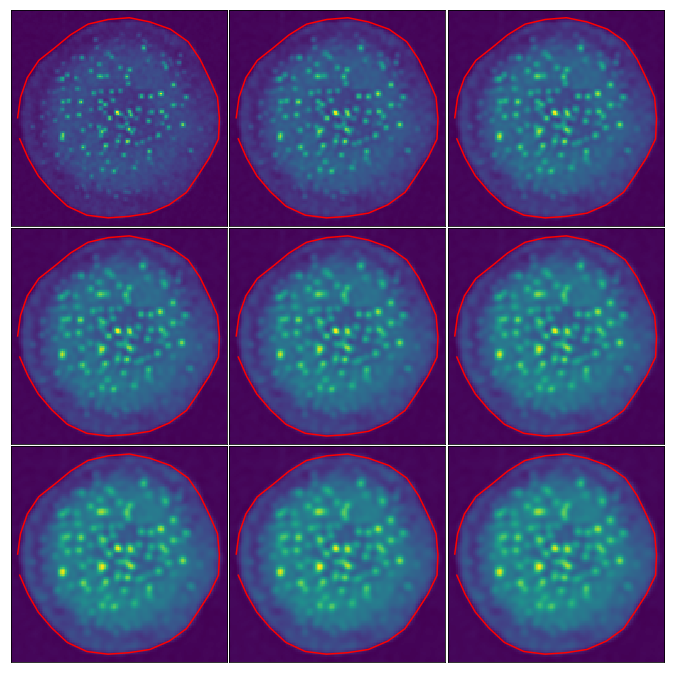

In [319]:
fig, ax = plt.subplots(3,3,figsize=[12,12])
ax = ax.flatten()
idx = np.random.choice(len(ds))
tmp_img = ds[idx][0][0].numpy().copy()
xy = 128*ds[idx][1].numpy()
alpha = .05
s2 = np.sqrt(2)
for k in range(90):
    diverge = convolve2d(tmp_img,np.array([[-1,-s2,-1],[-s2,4*(1+s2),-s2],[-1,-s2,-1]]),mode='same',boundary='wrap')
    tmp_img -= (-1)**k*alpha*diverge
    if k%10==9:
        i=(k-9)//10
        ax[i].imshow(tmp_img)
        ax[i].set_yticks([])
        ax[i].set_xticks([])
        ax[i].plot(xy[0,:],xy[1,:],'r')
plt.subplots_adjust(hspace=.01, wspace=-0.06)
plt.show()

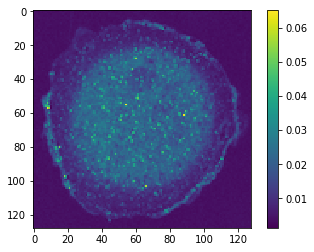

In [307]:
im = plt.imshow(ds[idx][0][0].numpy())
clim = im.get_clim()
plt.colorbar()

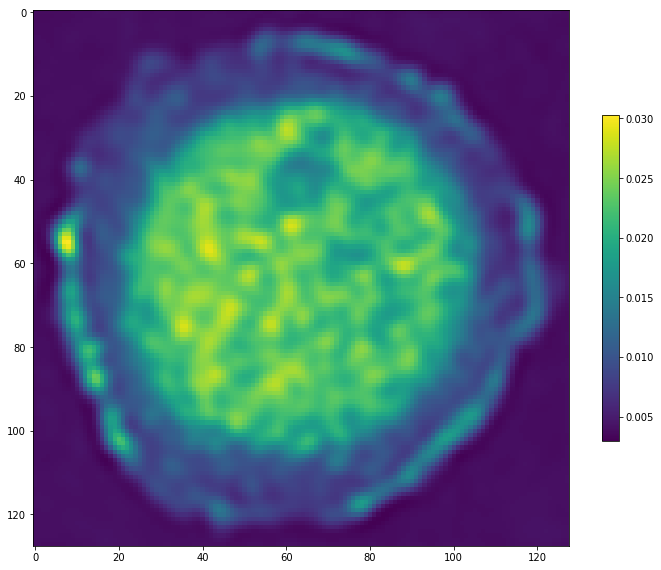

In [310]:
plt.figure(figsize=[12,12])
plt.imshow(tmp_img)
# plt.clim(clim)
plt.colorbar(shrink=.5)
plt.show()

In [269]:
np.sum(ds[0][0][0].numpy())

97.65602

In [270]:
np.sum(tmp_img)

97.65603

In [87]:
np.array([[-.5,1,-.5]*3]).shape

(1, 9)

In [73]:
model.convolution[0].bias.shape

torch.Size([32])